In [43]:
import keras
import numpy as np
import tensorflow as tf
from keras.applications import vgg19
from PIL import Image

base_image_path = '/content/images (1).jpg'
style_reference_image_path = "/content/abstract-multi-colored-illustration-vibrant-fractal-shapes-generated-by-ai.jpg"


# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = keras.utils.load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

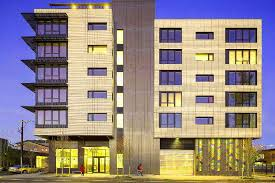

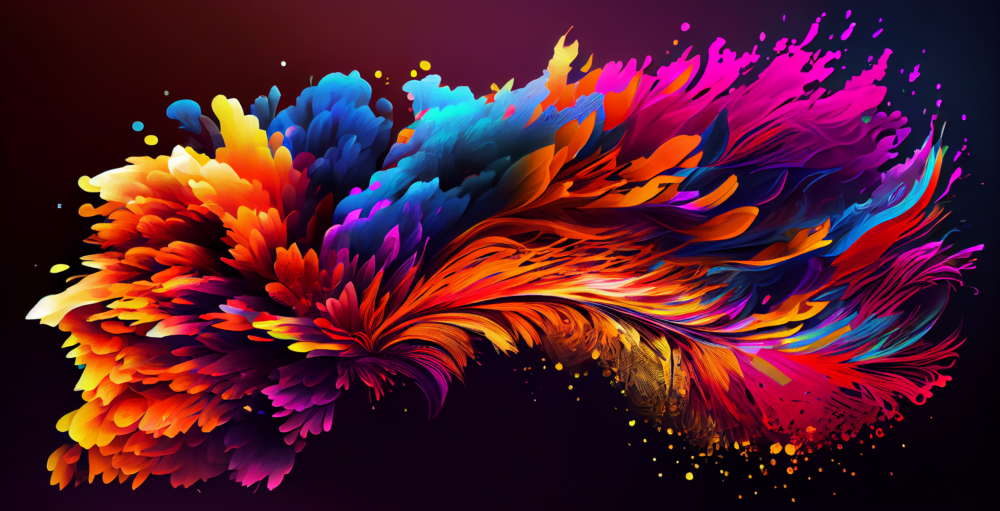

In [44]:
from IPython.display import Image, display

display(Image(base_image_path))
display(Image(style_reference_image_path))

In [45]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.utils.load_img(image_path, target_size=(img_nrows, img_ncols))
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [46]:
def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))


In [47]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

In [48]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [49]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [53]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

iterations = 4000
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = 'buliding_image' + "_at_iteration_%d.png" % i
        keras.utils.save_img(fname, img)

Iteration 100: loss=12135.02
Iteration 200: loss=7997.66
Iteration 300: loss=6796.19
Iteration 400: loss=6136.15
Iteration 500: loss=5697.98
Iteration 600: loss=5384.50
Iteration 700: loss=5148.29
Iteration 800: loss=4960.92
Iteration 900: loss=4808.27
Iteration 1000: loss=4681.19
Iteration 1100: loss=4573.81
Iteration 1200: loss=4483.07
Iteration 1300: loss=4404.92
Iteration 1400: loss=4337.10
Iteration 1500: loss=4277.44
Iteration 1600: loss=4224.15
Iteration 1700: loss=4176.48
Iteration 1800: loss=4133.66
Iteration 1900: loss=4094.84
Iteration 2000: loss=4059.63
Iteration 2100: loss=4027.47
Iteration 2200: loss=3997.94
Iteration 2300: loss=3970.69
Iteration 2400: loss=3945.53
Iteration 2500: loss=3922.25
Iteration 2600: loss=3900.49
Iteration 2700: loss=3880.31
Iteration 2800: loss=3861.45
Iteration 2900: loss=3843.80
Iteration 3000: loss=3827.41
Iteration 3100: loss=3812.20
Iteration 3200: loss=3797.98
Iteration 3300: loss=3784.63
Iteration 3400: loss=3772.03
Iteration 3500: loss=3

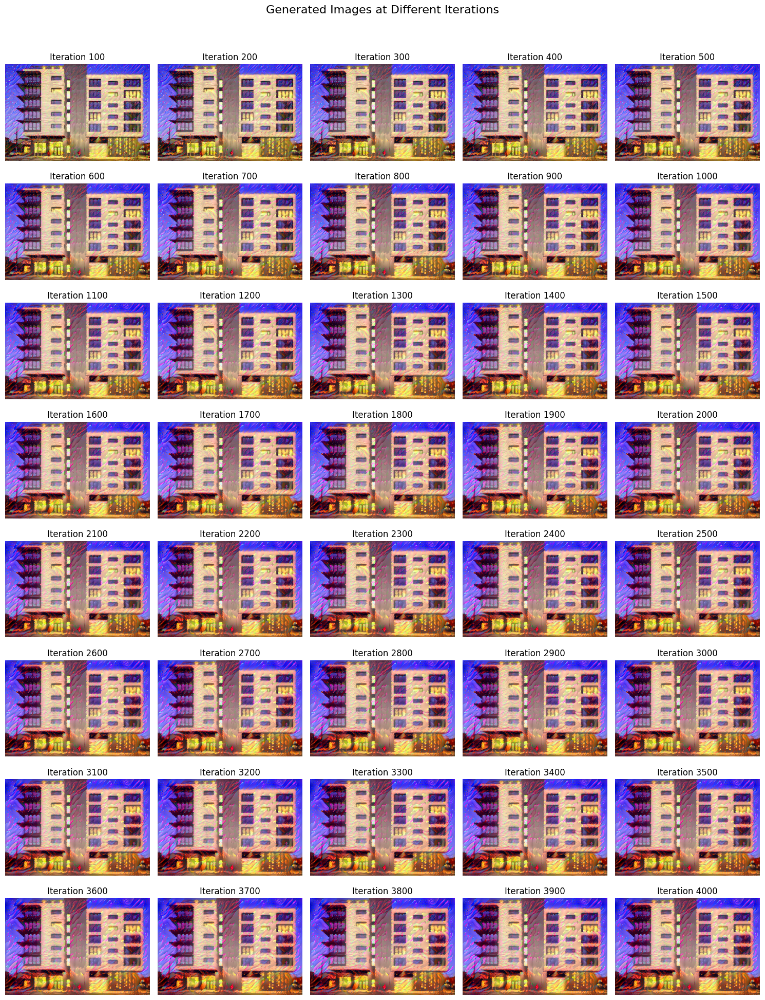

In [54]:
import matplotlib.pyplot as plt

# Assuming your images are stored in the directory /content/ and named paris_generated_at_iteration_i.png

# Set the number of images
num_images = 40

# Create subplots
fig, axes = plt.subplots(8, 5, figsize=(15, 20))
fig.suptitle('Generated Images at Different Iterations', fontsize=16)

# Loop through each iteration
for i in range(1, num_images + 1):
    # Construct the file path for the current iteration
    file_path = f'/content/buliding_image_at_iteration_{i*100}.png'

    # Read and display the image
    img = plt.imread(file_path)
    ax = axes[(i-1) // 5, (i-1) % 5]
    ax.imshow(img)
    ax.set_title(f'Iteration {i*100}')
    ax.axis('off')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()


In [51]:
def output_function(base_image,style_reference_image,combination_image,iterations):
  base_image = preprocess_image(base_image_path)
  style_reference_image = preprocess_image(style_reference_image_path)
  combination_image = tf.Variable(preprocess_image(base_image_path))
  for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i==iterations:
      img = deprocess_image(combination_image.numpy())
      return img





In [52]:
ii = output_function(base_image,style_reference_image,combination_image,4000)

KeyboardInterrupt: ignored

In [ ]:
plt.imshow(ii)